# Finding RNAfish spots in 256x256 images using Unet, Conv2d

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from PIL import Image
import random
import utils

In [2]:
data='/home/ubuntu/Data/'

# Get data

Load data from file

In [6]:
shp=[1,512,512,3]

In [7]:
both=utils.get_raw_float_image(data+'Training.tif_RotShift.raw',shp)


In [27]:
train_data=both[:,:,:,[0]]/65535.0
train_truth=both[:,:,:,[1,2]]

#mean=np.mean(train_data)
std=np.std(train_data)


train_data=(train_data)/std
train_truth[np.where(train_truth>0.1)]=1

validation=utils.get_raw_float_image(data+'Validation.raw',shp)

validation_data=validation[:,:,:,[0]]/65535.0
validation_truth=validation[:,:,:,[1,2]]
validation_data=(validation_data)/std
validation_truth[np.where(validation_truth>0.1)]=1

In [28]:
np.median(train_truth[0,:,:,0])

0.0

In [29]:
print(std)

0.14549635


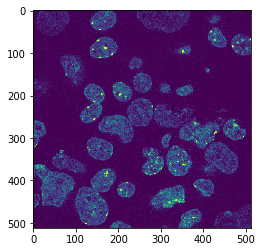

In [30]:
plt.imshow(validation_data[0,:,:,0])

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [38]:
tf.reset_default_graph()
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, 512,512,1], name='x')
y=tf.placeholder(dtype=tf.float32, shape=[None, 512,512,2], name='y')
lr=tf.placeholder(dtype=tf.float32, shape=[], name='learning_rate')
dr=tf.placeholder(dtype=tf.float32, shape=[], name='dropout_rate')

regularizer = tf.contrib.layers.l2_regularizer(scale=0.1)

xr=x
yr=y

base_scaler=32

#Going down
A1=utils.leaky_relu(tf.layers.conv2d(xr, base_scaler, [5,5], padding='SAME', kernel_regularizer=regularizer))
A2=utils.leaky_relu(tf.layers.conv2d(A1, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

B0=tf.nn.max_pool(A2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
B1=utils.leaky_relu(tf.layers.conv2d(B0, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
B2=utils.leaky_relu(tf.layers.conv2d(B1, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

C0=tf.nn.max_pool(B2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
C1=utils.leaky_relu(tf.layers.conv2d(C0, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
C2=utils.leaky_relu(tf.layers.conv2d(C1, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

D0=tf.nn.max_pool(C2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
D1=utils.leaky_relu(tf.layers.conv2d(D0, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
D2=utils.leaky_relu(tf.layers.conv2d(D1, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

E0=tf.nn.max_pool(D2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
E1=utils.leaky_relu(tf.layers.conv2d(E0, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
E2=utils.leaky_relu(tf.layers.conv2d(E1, 16*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

#Coming up
DD0=tf.layers.conv2d_transpose(E2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
DD1=tf.concat(axis=3, values=[DD0,D2])
DD2=utils.leaky_relu(tf.layers.conv2d(DD1, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
DD3=utils.leaky_relu(tf.layers.conv2d(DD2, 8*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

CC0=tf.layers.conv2d_transpose(DD3, 4*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
CC1=tf.concat(axis=3, values=[CC0,C2])
CC2=utils.leaky_relu(tf.layers.conv2d(CC1, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
CC3=utils.leaky_relu(tf.layers.conv2d(CC2, 4*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

BB0=tf.layers.conv2d_transpose(CC3, 2*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#BB0=tf.contrib.layers.conv2d_transpose(C2, 2*base_scaler, kernel_size=[3,3], stride=[2, 2], padding='SAME')
BB1=tf.concat(axis=3, values=[BB0,B2])
BB2=utils.leaky_relu(tf.layers.conv2d(BB1, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
BB3=utils.leaky_relu(tf.layers.conv2d(BB2, 2*base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

AA0=tf.layers.conv2d_transpose(BB3, base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
AA1=tf.concat(axis=3, values=[AA0,A2])
AA2=utils.leaky_relu(tf.layers.conv2d(AA1, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))
AA3=utils.leaky_relu(tf.layers.conv2d(AA2, base_scaler, [3,3], padding='SAME', kernel_regularizer=regularizer))

logits=utils.leaky_relu(tf.layers.conv2d(AA3, 2, [1,1], padding='SAME', kernel_regularizer=regularizer))
probs=tf.tanh(logits, name='probabilities')

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
#Added this to make the outlines more potent in error function
OutError, MaskError=tf.split(LSQ, [1,1], 3)
loss=1*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
#loss=tf.reduce_mean(LSQ, name='error')
l2_loss = tf.losses.get_regularization_loss()
#loss=loss+l2_loss/1000

train_op=tf.train.AdamOptimizer(learning_rate=lr, name='trainer').minimize(loss)

tf.summary.scalar('loss', loss)
tf.summary.image('input', x, 4)
tf.summary.image('standard', tf.reshape(y[:,:,:,0], [-1,512,512,1]), 4)
tf.summary.image('processed', tf.reshape(probs[:,:,:,0], [-1,512,512,1]), 4)


merge = tf.summary.merge_all()

# Training on easy set

0
Training loss:  0.06914879
(4, 512, 512, 2)
Validation loss:  0.05283335


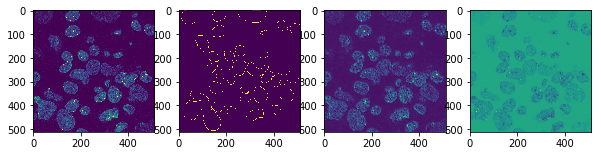

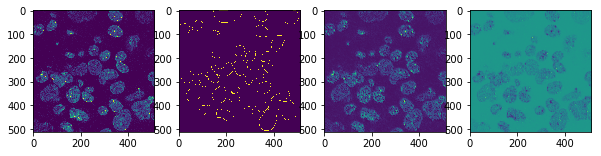

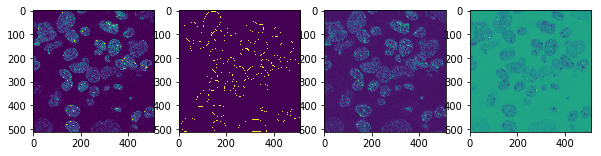

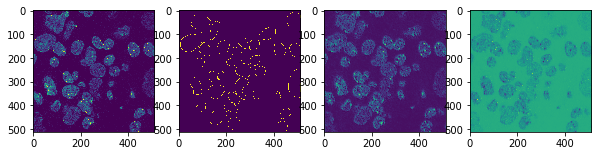

100
Training loss:  0.04010044
(4, 512, 512, 2)
Validation loss:  0.034099363


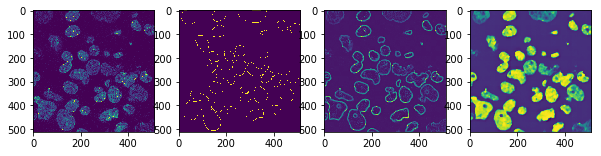

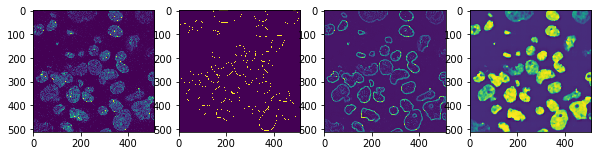

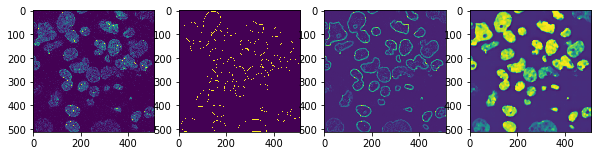

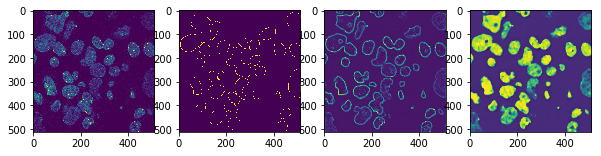

200
Training loss:  0.025525168
(4, 512, 512, 2)
Validation loss:  0.031915706


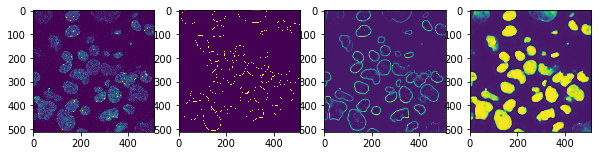

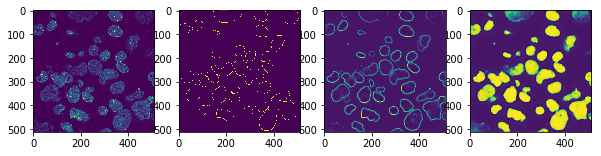

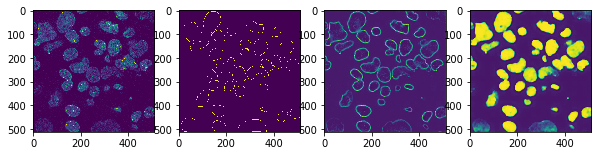

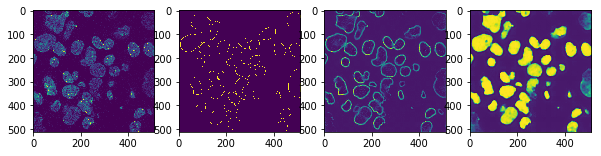

300
Training loss:  0.026696289
(4, 512, 512, 2)
Validation loss:  0.030289508


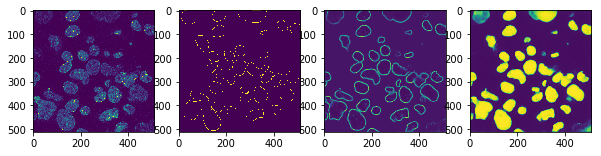

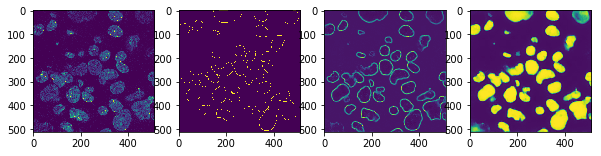

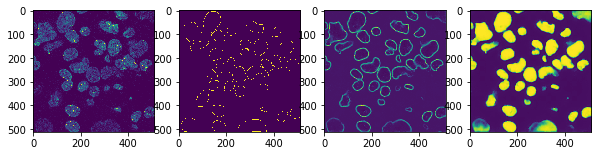

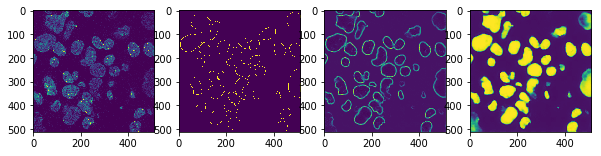

400
Training loss:  0.022686346
(4, 512, 512, 2)
Validation loss:  0.030105919


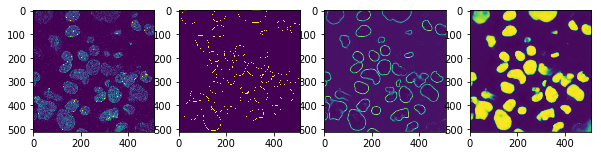

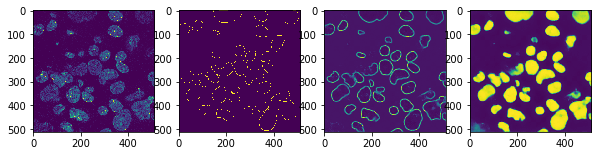

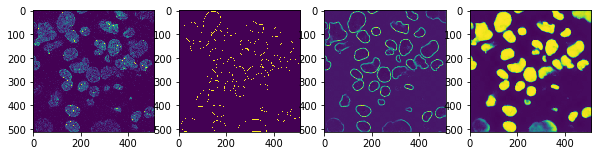

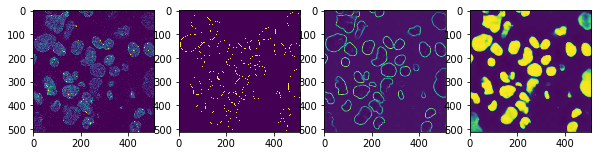

500
Training loss:  0.02674207
(4, 512, 512, 2)
Validation loss:  0.028835034


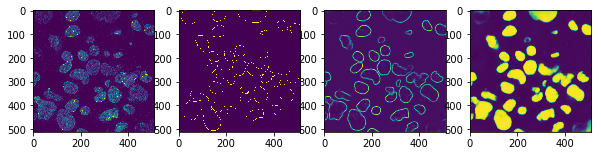

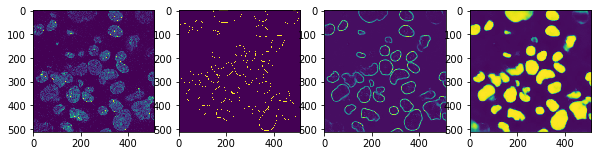

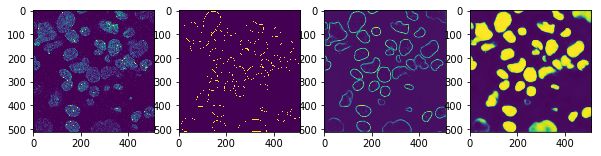

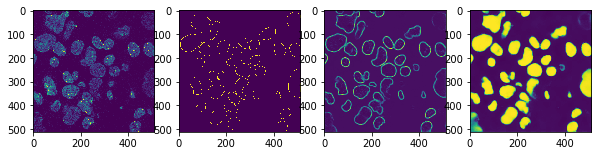

600
Training loss:  0.022295032
(4, 512, 512, 2)
Validation loss:  0.027775718


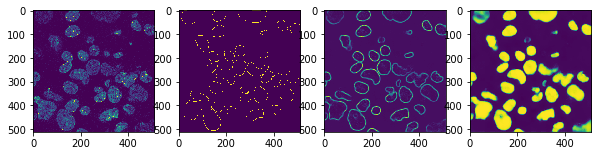

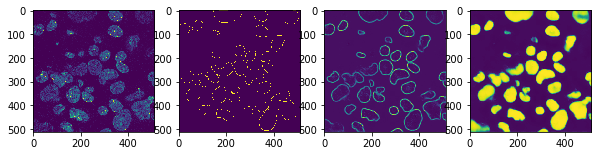

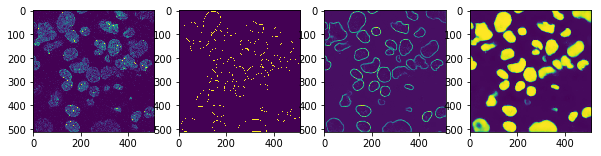

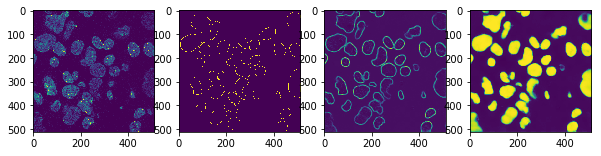

700
Training loss:  0.02415368
(4, 512, 512, 2)
Validation loss:  0.028376231


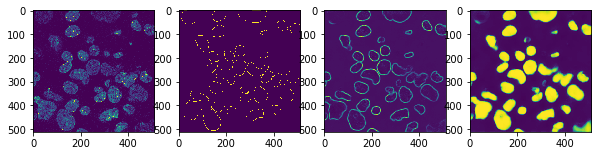

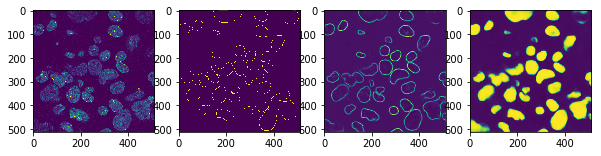

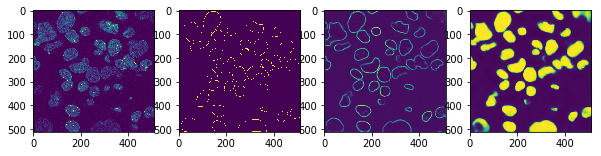

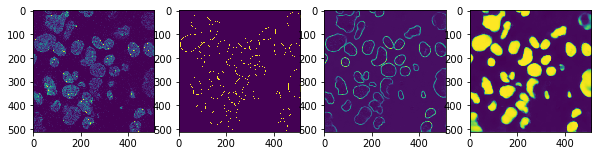

800
Training loss:  0.027547304
(4, 512, 512, 2)
Validation loss:  0.02779118


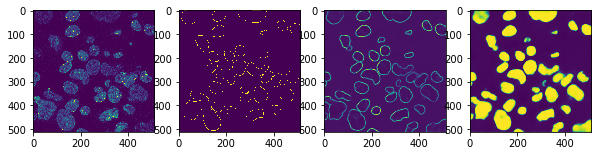

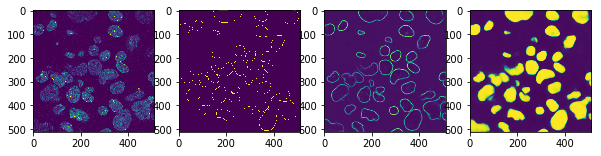

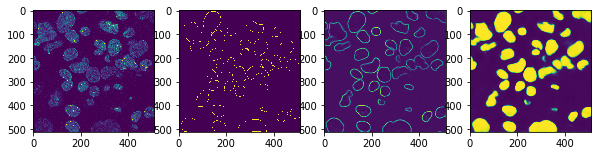

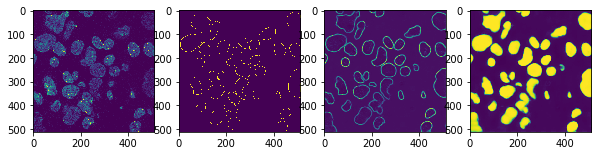

900
Training loss:  0.021871384
(4, 512, 512, 2)
Validation loss:  0.028102942


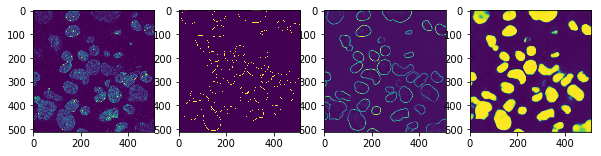

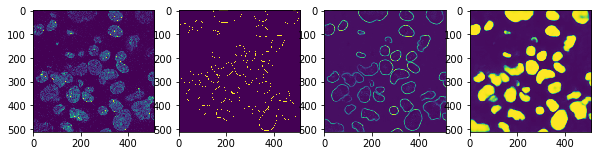

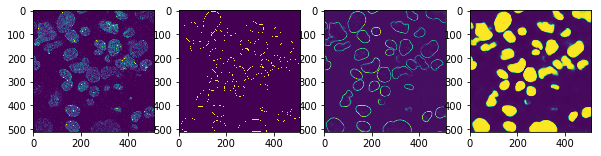

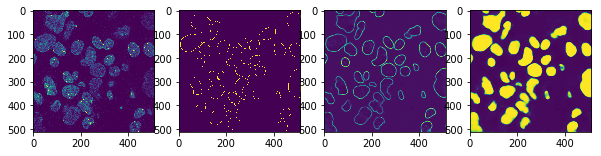

1000
Training loss:  0.02173476
(4, 512, 512, 2)
Validation loss:  0.028064614


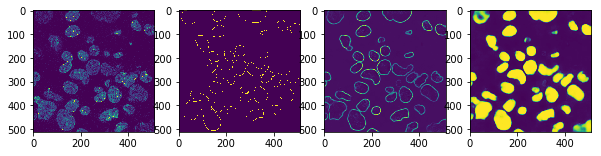

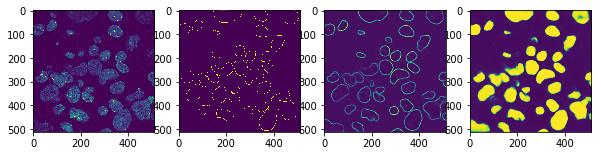

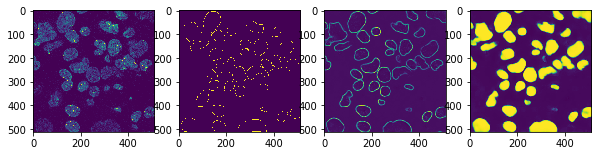

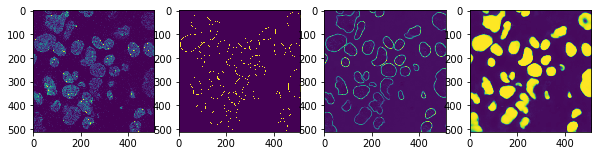

1100
Training loss:  0.021018056
(4, 512, 512, 2)
Validation loss:  0.027779663


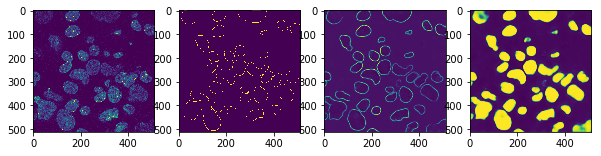

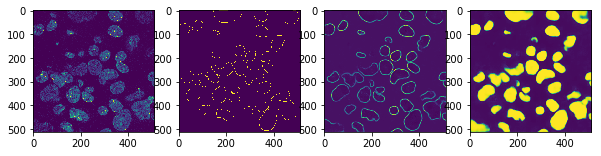

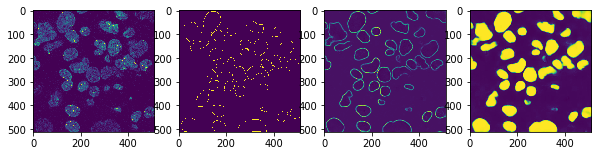

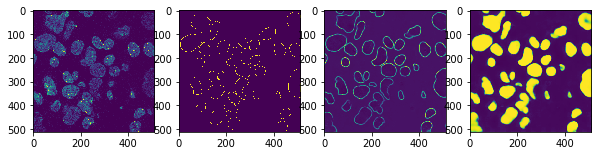

1200
Training loss:  0.023460433
(4, 512, 512, 2)
Validation loss:  0.028481498


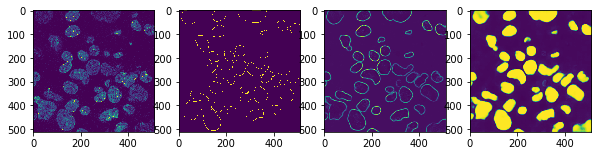

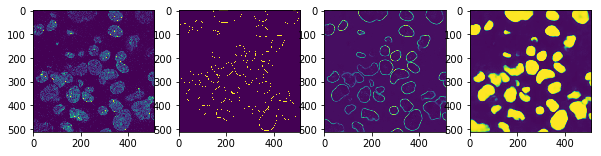

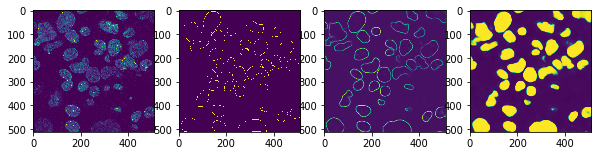

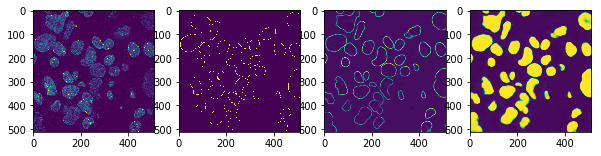

1300
Training loss:  0.017165797
(4, 512, 512, 2)
Validation loss:  0.028335815


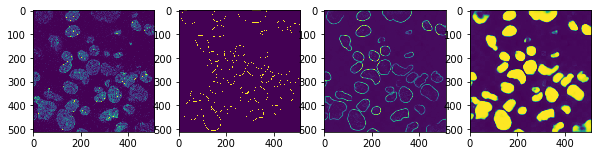

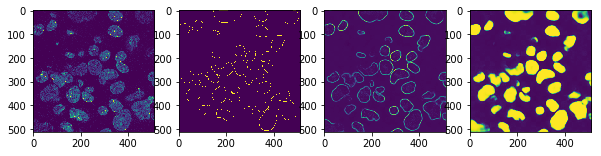

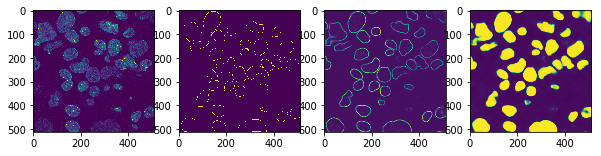

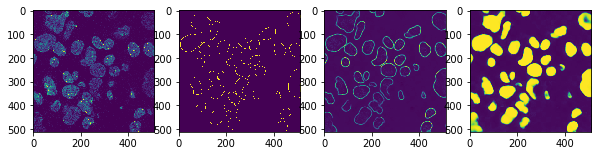

1400
Training loss:  0.016941408
(4, 512, 512, 2)
Validation loss:  0.02921825


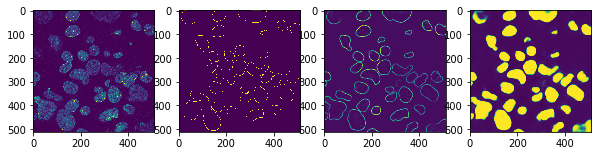

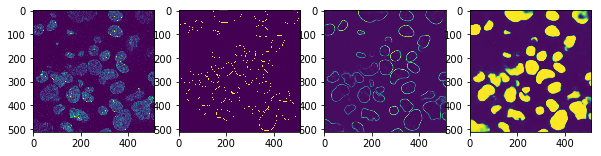

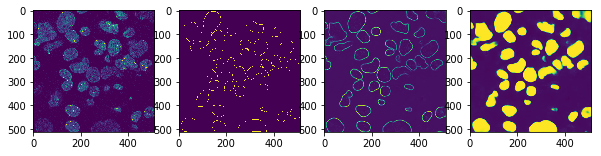

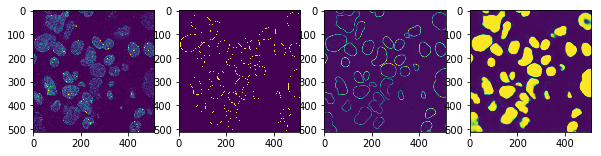

1500
Training loss:  0.01803577
(4, 512, 512, 2)
Validation loss:  0.02882753


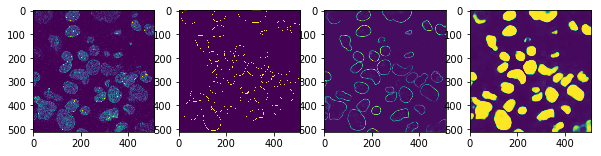

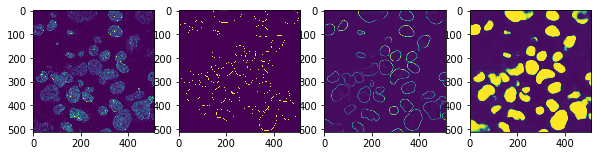

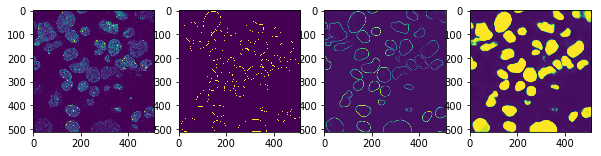

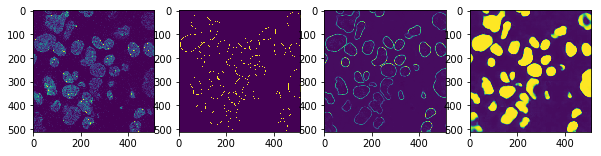

1600
Training loss:  0.014561254
(4, 512, 512, 2)
Validation loss:  0.029658329


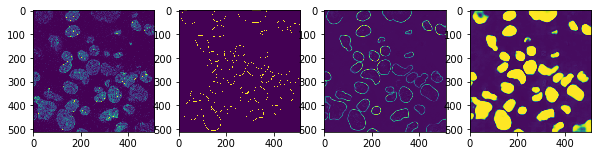

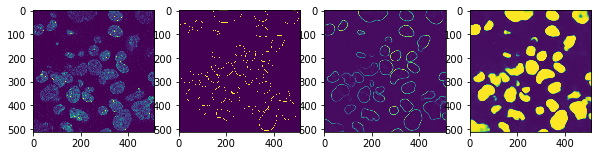

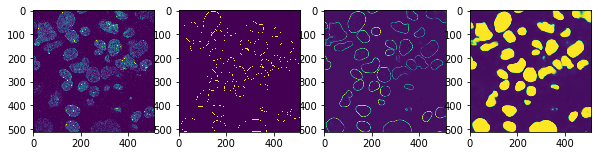

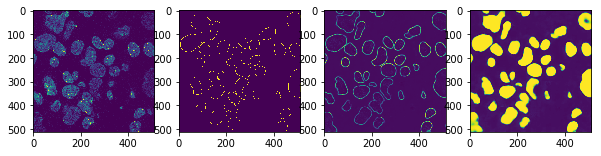

1700
Training loss:  0.016077418
(4, 512, 512, 2)
Validation loss:  0.029848501


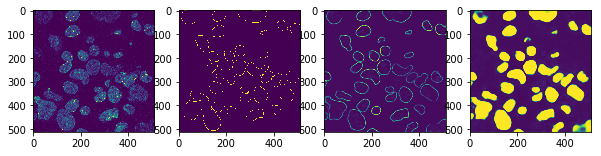

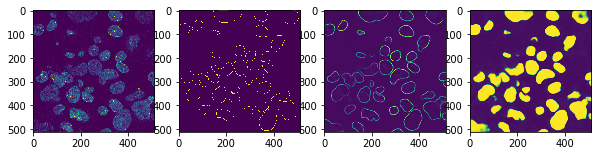

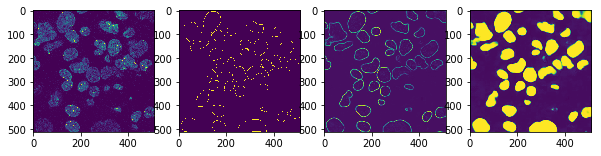

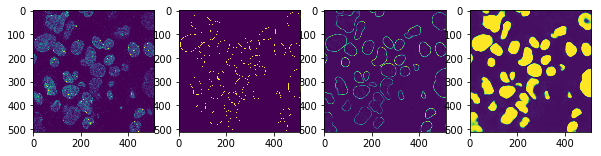

1800
Training loss:  0.01516829
(4, 512, 512, 2)
Validation loss:  0.029920934


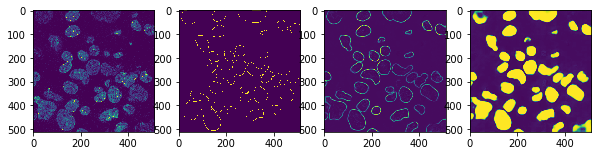

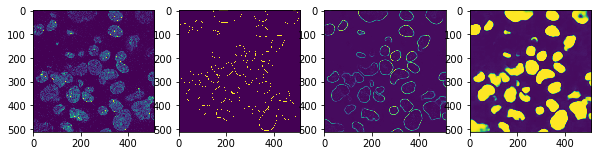

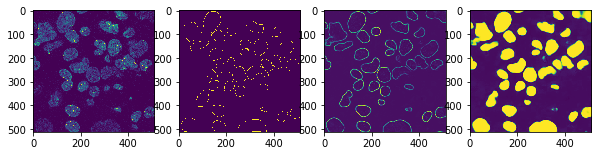

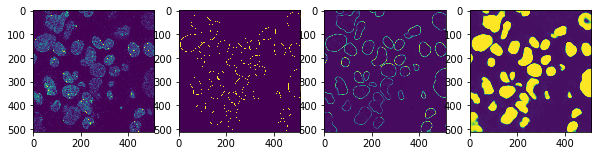

1900
Training loss:  0.014511675
(4, 512, 512, 2)
Validation loss:  0.030314514


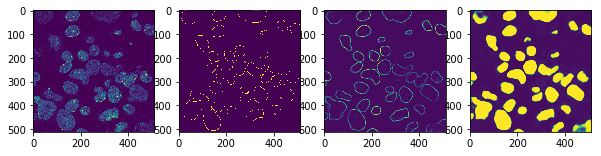

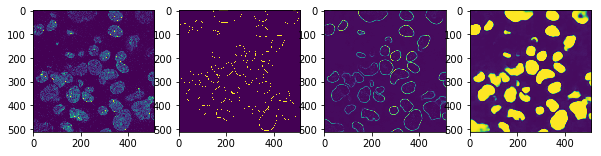

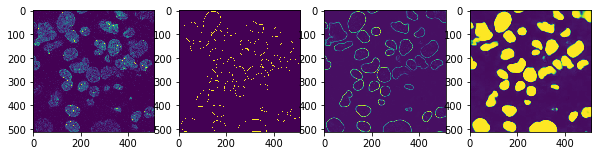

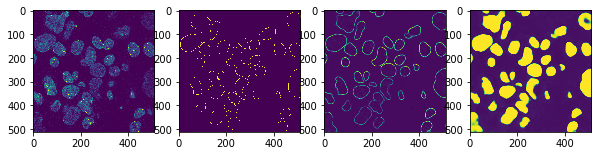

2000
Training loss:  0.02125931
(4, 512, 512, 2)
Validation loss:  0.0303491


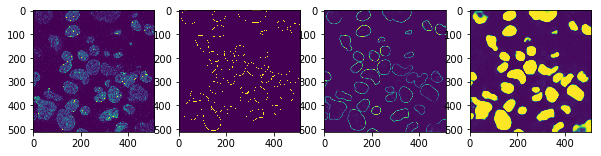

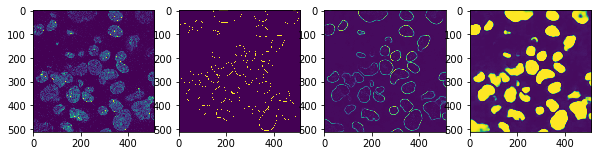

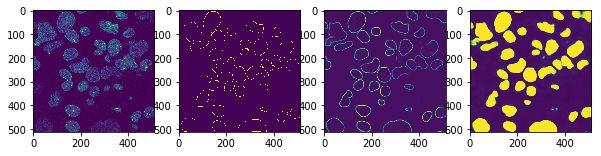

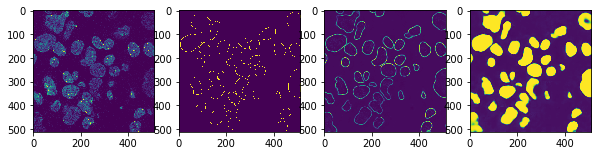

2100
Training loss:  0.014497383
(4, 512, 512, 2)
Validation loss:  0.030388182


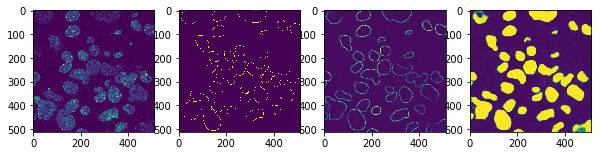

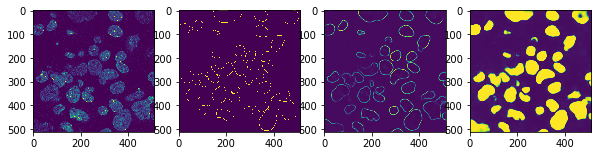

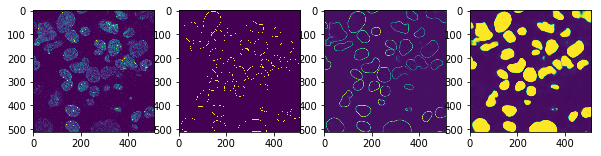

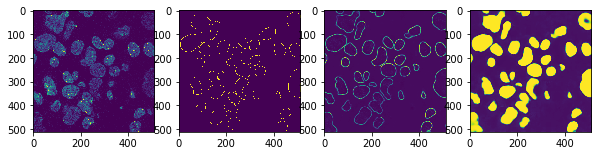

2200
Training loss:  0.0113601135
(4, 512, 512, 2)
Validation loss:  0.030325647


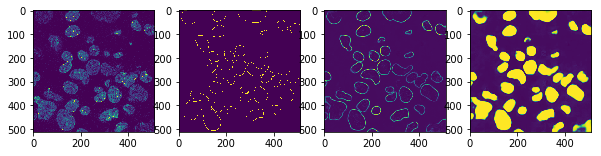

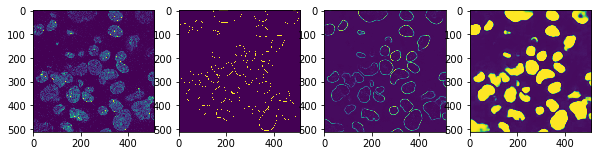

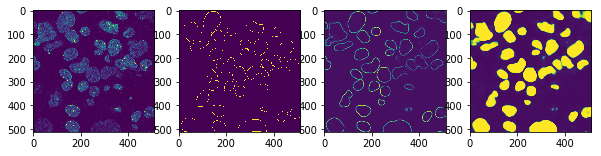

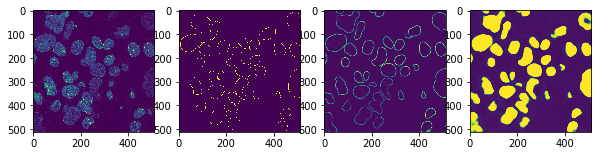

2300
Training loss:  0.018274881
(4, 512, 512, 2)
Validation loss:  0.030503664


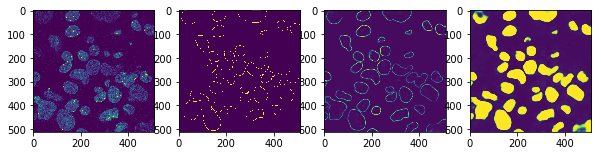

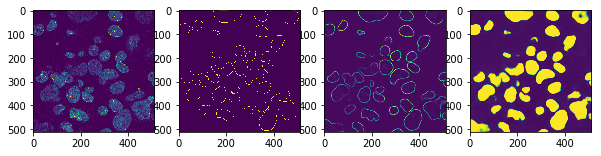

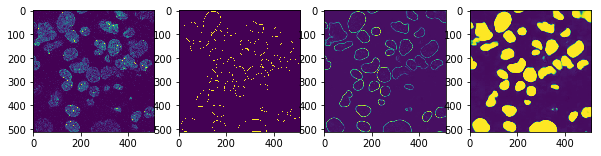

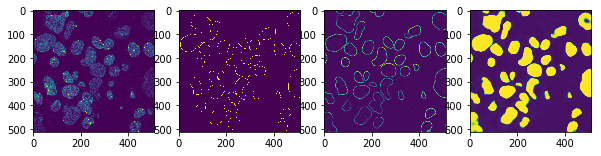

2400
Training loss:  0.014508142
(4, 512, 512, 2)
Validation loss:  0.030840112


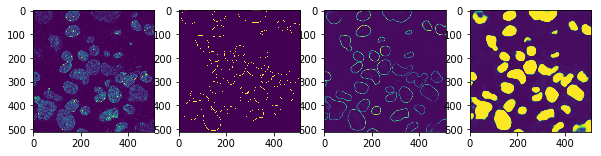

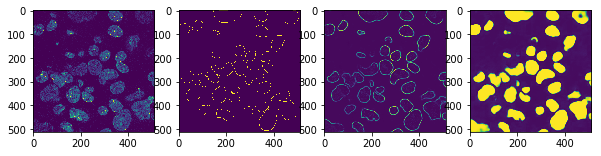

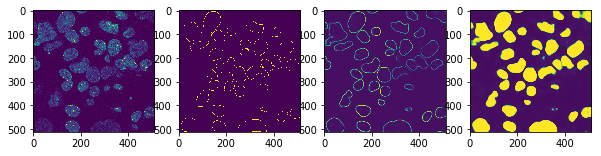

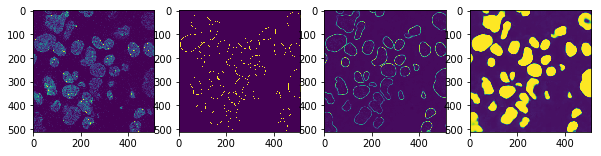

2500
Training loss:  0.015102524
(4, 512, 512, 2)
Validation loss:  0.030663412


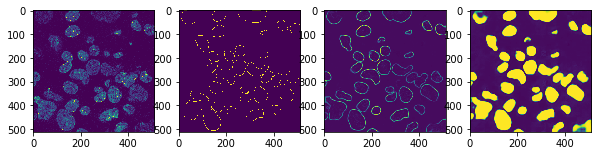

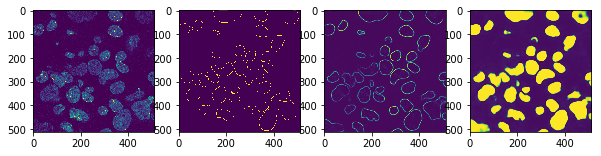

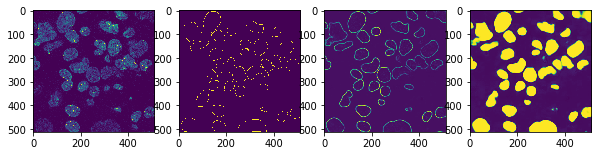

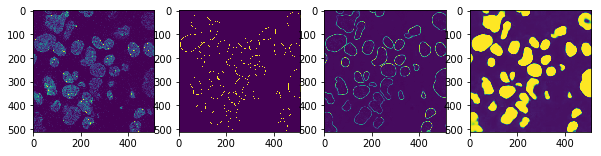

2600
Training loss:  0.018653365
(4, 512, 512, 2)
Validation loss:  0.030655334


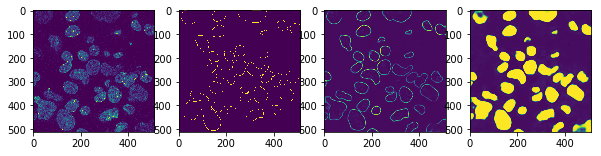

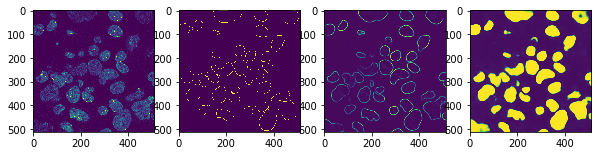

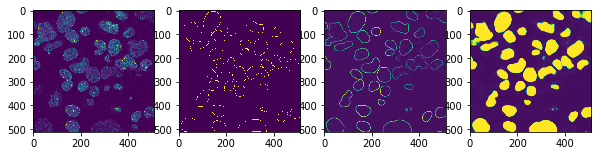

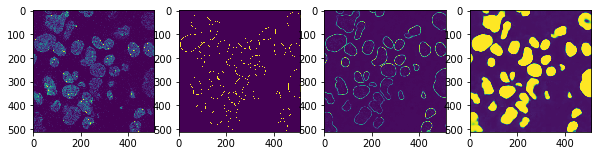

2700
Training loss:  0.015362564
(4, 512, 512, 2)
Validation loss:  0.030523233


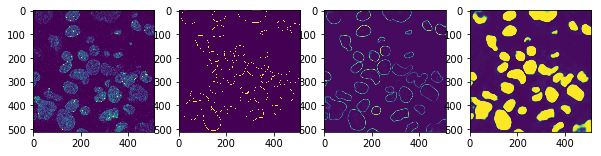

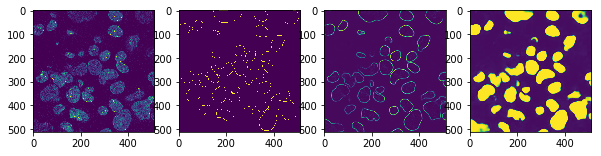

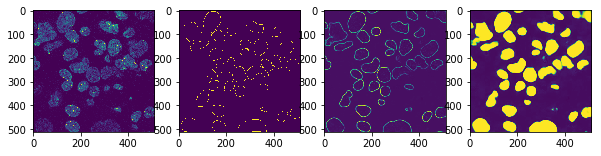

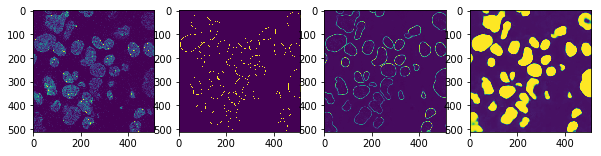

KeyboardInterrupt: 

In [39]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver(max_to_keep=50)
#train_writer = tf.summary.FileWriter('./logs/1/train ', sess.graph)
test_writer = tf.summary.FileWriter('./logs/123/test ')


learning_rates=[0.000195, 0.0001, 0.00002, 0.00001]
learning_rate_steps=[500,1500, 2200, 5200]
current_step=0
for lrate, lrs in zip(learning_rates, learning_rate_steps):
    for i in range(current_step, lrs):
        idx=np.random.choice(train_data.shape[0], replace=False, size=[25])
        cur_train=train_data[idx,:,:,:]+np.random.uniform(-0.005, 0.005, 1)
        cur_truth=train_truth[idx,:,:,:]
        _, results, losses=sess.run([train_op,  probs, loss], feed_dict={x:cur_train, y:cur_truth, lr:lrate})
        #train_writer.add_summary(summary, i)
        if (i%100==0):
            print(i)
            print("Training loss: ",losses)
            #idx=np.random.choice(validation_data.shape[0], replace=False, size=[50])
            idx=range(0,4, 1)
            sub_validation_data=validation_data[idx, :,:,:]
            sub_validation_truth=validation_truth[idx, :,:,:]
            summary, results, losses, a,c,cc=sess.run([merge, probs, loss, A1,C2,CC2], feed_dict={x:sub_validation_data, y:sub_validation_truth})
            test_writer.add_summary(summary, i)
            print(results.shape)
            print("Validation loss: ",losses)
            for ti in range (0,4):
                utils.plot_4x1(sub_validation_data[ti,:,:,0], sub_validation_truth[ti,:,:,0], results[ti,:,:,0], results[ti,:,:,1])
                plt.show()
            saver.save(sess, data+'NewModels/Model'+str(i))
    current_step=lrs

(4, 512, 512, 1)
Validation loss:  0.0006480112


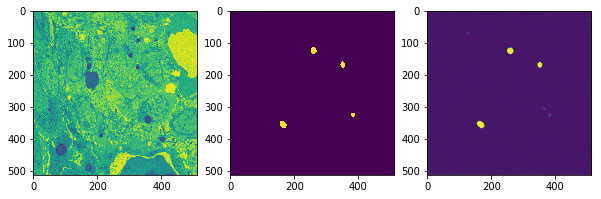

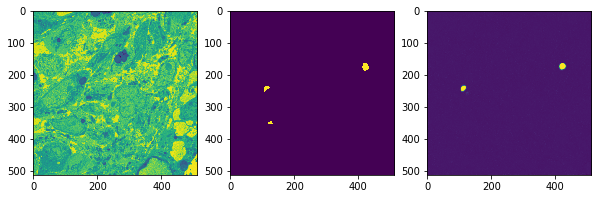

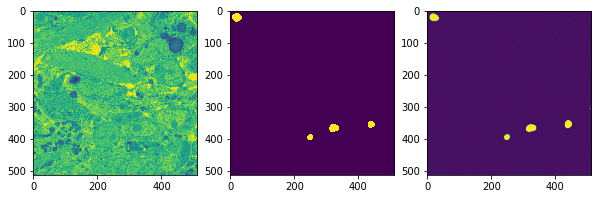

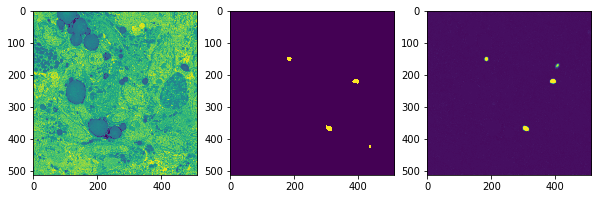

In [13]:
noise=8
idx=range(0,4, 1)
sub_validation_data=validation_data[idx, :,:,:]+noise
sub_validation_truth=validation_truth[idx, :,:]
summary, results, losses, a,c,cc=sess.run([merge, probs, loss, A1,C2,CC2], feed_dict={x:sub_validation_data, y:sub_validation_truth})
print(results.shape)
print("Validation loss: ",losses)
for ti in range (0,4):
    utils.plot_3x1(sub_validation_data[ti,:,:,0], sub_validation_truth[ti,:,:,0], results[ti,:,:,0])
    plt.show()

In [21]:
tf.train.write_graph(sess.graph_def, 'Data/NewModels/', 'saved_3100.pb', as_text=False)

'Data/NewModels/saved_3100.pb'

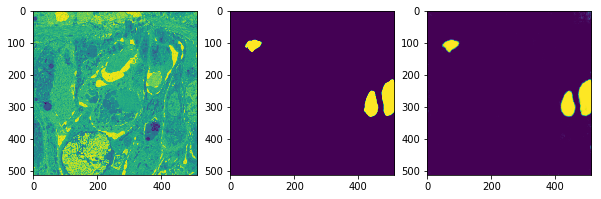

In [31]:
idx=np.random.choice(validation_data.shape[0], replace=False, size=[25])
cur_train=train_data[idx,:,:,:]
cur_truth=train_truth[idx,:,:]
results, losses=sess.run([probs, loss], feed_dict={x:cur_train, y:cur_truth, lr:lrate})

ids=4
utils.plot_3x1(cur_train[ids,:,:,0], cur_truth[ids,:,:,0], results[ids,:,:,0])

# Process new datafiles using trained network

Load the network that works best

In [40]:
saver = tf.train.Saver()
sess=tf.Session()
sess.run(tf.global_variables_initializer())

data_model=data+'NewModels/Model1300'
saver.restore(sess,data_model)

INFO:tensorflow:Restoring parameters from /home/ubuntu/Data/NewModels/Model1300


Function for processing a file

In [9]:
print([mean, std])

[0.6918361, 0.07028653]


In [47]:
def process_file(sess, file_name):
    file_data=utils.get_raw_float_image(file_name, [1,512,512,1])
    file_data=np.reshape(file_data, [file_data.shape[0], 512, 512, 1])
    true_test2_data=file_data[:,:,:,[0]]/65535.0
    file_data=0
    
    #true_test2_data=true_test2_data/np.std(true_test2_data)*0.02
    #true_test2_data=true_test2_data-np.mean(true_test2_data)+0.55
    true_test2_data=(true_test2_data)/0.1455

    print(np.std(true_test2_data))
    print(np.mean(true_test2_data))
    
    
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,512,512,2])
    process_batch_size=20
    print('Starting')
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:]
        [results]=sess.run([probs], feed_dict={x:sub_validation_data})
        output[t:(t+process_batch_size),:,:,0]=results[:,:,:,0]
        output[t:(t+process_batch_size),:,:,1]=results[:,:,:,1]
    print('Done')
    true_test2_data=0
    true_test2_truth=0
    output=np.swapaxes(np.swapaxes(output,3,2),2,1)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_output.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [49]:
output=process_file(sess,data+'Test.raw')

0.9893431
0.36724344
Starting
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(20, 512, 512, 2)
(4, 512, 512, 2)
Done
/home/ubuntu/Data/Test_output.raw


In [14]:
for f in glob.glob('/ssd1/smc/Planaria/*.raw'):
    output=process_file(sess, f)

(289, 512, 512, 2)

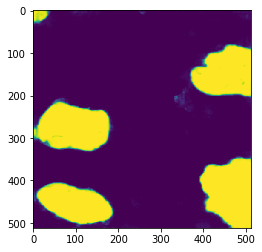

In [22]:
plt.imshow(output[10,:,:,1])